In [1]:
import sys
sys.path.append("../")

In [2]:
import numpy as np
import cv2
import torch
from inverse_warp import inverse_warp
import matplotlib.pyplot as plt

In [3]:
def photometric_loss(img, depth_img, pose, intrinsics):
    warped_img, valid_points = inverse_warp(img, depth_img, pose, intrinsics)
    
    diff = (img - warped_img) * valid_points.unsqueeze(1).float()
    return diff.abs().mean(), diff, warped_img, valid_points

In [4]:
def intrinsics(img_size=64):
    FOV = 110
    focal_length = (FOV/2) / np.tan((img_size/2))

    intrinsics = np.array([[focal_length, 0, img_size/2],
                           [0, focal_length, img_size/2],
                           [0, 0, 1]])
    intrinsics = torch.from_numpy(intrinsics.astype(np.float32)).unsqueeze(0)
    return intrinsics

In [5]:
intrinsics()

tensor([[[83.2065,  0.0000, 32.0000],
         [ 0.0000, 83.2065, 32.0000],
         [ 0.0000,  0.0000,  1.0000]]])

In [6]:
def depth_plane(img_size=64, depth=150):
    depth_plane = np.full((img_size, img_size, 1), depth, dtype=np.uint8)

    depth_plane = np.transpose(depth_plane, (2, 0, 1))
    depth_plane = torch.from_numpy(depth_plane.astype(np.float32))
    
    return depth_plane

In [7]:
depth_plane()

tensor([[[150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         ...,
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.],
         [150., 150., 150.,  ..., 150., 150., 150.]]])

In [8]:
video_name = "MineRLNavigate-v0/v3_absolute_grape_changeling-12_2293-4124"
# video_name = "MineRLTreechop-v0/v3_hideous_breadfruit_golum-6_308-2269"
# video_name = "MineRLNavigate-v0/v3_ready_wasabi_orc-14_6199-8086"

In [9]:
import json

actions = np.load(f"../mc/videos/{video_name}/rendered.npz")

with open(f"../mc/videos/{video_name}/metadata.json") as file:
    meta = json.load(file)
    
max_frame_num = meta["true_video_frame_count"]

num_states = actions["reward"].shape[0]

annotated_frames = []

video = cv2.VideoCapture(f"../mc/videos/{video_name}/recording.mp4")

# the video length does not match to the actions length: https://github.com/minerllabs/minerl/blob/8cc204360fdae39d18808facb21873baaed98b1c/minerl/data/data_pipeline.py#L265
video_start = max_frame_num - num_states
for _ in range(max_frame_num - num_states):
    video.read()

i = 0
while video.isOpened():
    ret, frame = video.read()
    
    if not ret:
        break
    
    cv2.cvtColor(frame, code=cv2.COLOR_BGR2RGB, dst=frame)
    frame = np.asarray(np.clip(frame, 0, 255), dtype=np.uint8)
        
    action = {
        "forward" : actions["action$forward"][i],
        "left" : actions["action$left"][i],
        "right" : actions["action$right"][i],
        "sneak" : actions["action$sneak"][i],
        "sprint" : actions["action$sprint"][i],
        "camera" : actions["action$camera"][i]
        
    }
    annotated_frames.append((frame, action))
    i += 1

In [10]:
def convert_frame_to_tensor(frame):
    return torch.from_numpy(np.transpose(frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

def convert_tensor_to_frame(tensor):
    return np.abs(np.transpose(tensor.squeeze(0), (1, 2, 0)).numpy()).astype(np.uint8)

# Single image

In [11]:
def visualize_diff(frame, next_frame, depth_tensor, pose_tensor, intrinsics, interactive=False):
    frame_tensor = convert_frame_to_tensor(frame)
    
    next_frame_tensor = convert_frame_to_tensor(next_frame)

    warped_frame_tensor, valid_points = inverse_warp(frame_tensor, depth_tensor, pose_tensor, intrinsics)
        
    diff = (next_frame_tensor - warped_frame_tensor) * valid_points.unsqueeze(1).float()
    
    loss = diff.abs().mean()
    
    warped_frame = convert_tensor_to_frame(warped_frame_tensor)
    
    diff_img = convert_tensor_to_frame(diff)
    
    # diffs
    warped_frame_hsv = np.empty(warped_frame.shape)
    warped_frame_hsv = cv2.cvtColor(warped_frame, cv2.COLOR_RGB2HSV)
    warped_frame_hs_tensor = convert_frame_to_tensor(warped_frame_hsv[:,:,:2])
    
    next_frame_hsv = np.empty(next_frame.shape)
    next_frame_hsv = cv2.cvtColor(next_frame, cv2.COLOR_RGB2HSV)
    next_frame_hs_tensor = convert_frame_to_tensor(next_frame_hsv[:,:,:2])
    
    diff_hs_tensor = (next_frame_hs_tensor - warped_frame_hs_tensor) * valid_points.unsqueeze(1).float()

    loss_hs = diff_hs_tensor.abs().mean()
    diff_hs_img = convert_tensor_to_frame(diff_hs_tensor)    
    
    diff_img_sum = np.abs(diff_img[:,:,0]) + np.abs(diff_img[:,:,1]) + np.abs(diff_img[:,:,2])
    diff_hs_img_sum = np.abs(diff_hs_img[:,:,0]) + np.abs(diff_hs_img[:,:,1])
        
    
    print(f"pose: {pose_tensor.numpy()}, loss RGB: {float(loss)}, loss HS {float(loss_hs)}")
    
    if interactive:
        import plotly.graph_objects as go
        from plotly.subplots import make_subplots
        
        fig = make_subplots(rows=2, cols=3,
                            subplot_titles=("orig frame", "next frame", "warped orig frame", "diff", "HS diff"),
                            vertical_spacing=0.05)
        fig.add_trace(go.Image(z=frame), row=1, col=1)
        fig.add_trace(go.Image(z=next_frame), row=1, col=2)
        fig.add_trace(go.Image(z=warped_frame), row=1, col=3)
        
        fig.add_trace(go.Heatmap(z=diff_img_sum, zmin=0, zmax=255*3), row=2, col=1)
        fig.add_trace(go.Heatmap(z=diff_hs_img_sum, zmin=0, zmax=255*3), row=2, col=2)
        
        fig.update_xaxes(matches="x")
        fig.update_yaxes(matches="y")
        
        fig.update_layout(height=800, width=1000)
        
        fig.show()
    else:
        plt.figure(figsize=(20, 20))
        plt.subplot(1, 3, 1)
        plt.imshow(frame)
        plt.subplot(1, 3, 2)
        plt.imshow(next_frame)
        plt.subplot(1, 3, 3)
        plt.imshow(warped_frame)
        plt.show()

        plt.figure(figsize=(20, 20))
        plt.subplot(1, 2, 1)
        plt.title("RGB diff")
        plt.imshow(diff_img_sum, vmin=0, vmax=255*3, cmap="gray", interpolation="nearest")
        plt.subplot(1, 2, 2)
        plt.title("HS diff")
        plt.imshow(diff_hs_img_sum, vmin=0, vmax=255*3, cmap="gray", interpolation="nearest")
        plt.show()

## Low res

### 32x32

{'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


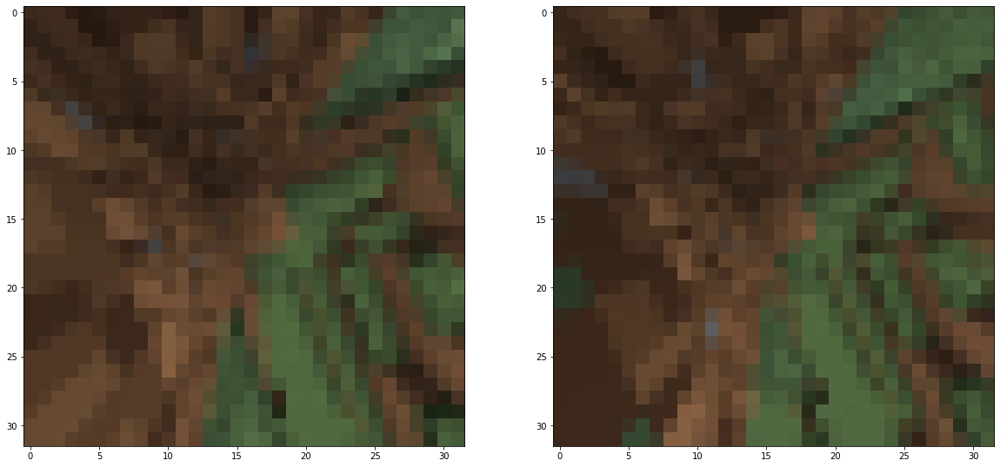

In [12]:
i = 323

first_frame = cv2.resize(annotated_frames[i][0], (32, 32)) 

second_frame = cv2.resize(annotated_frames[i + 1][0], (32, 32)) 

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 11.829345703125, loss HS 8.35009765625


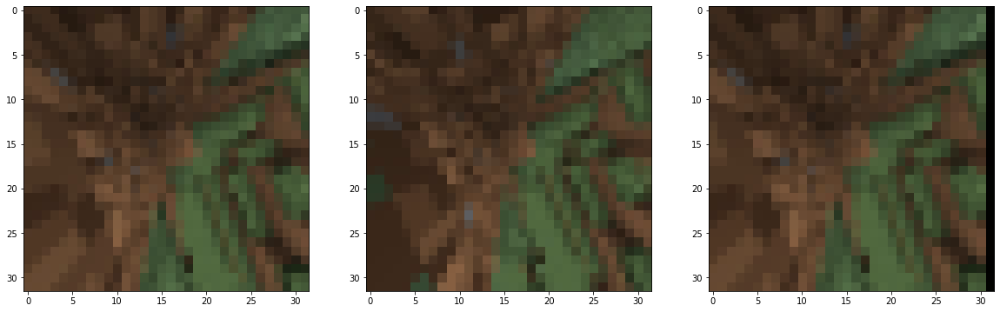

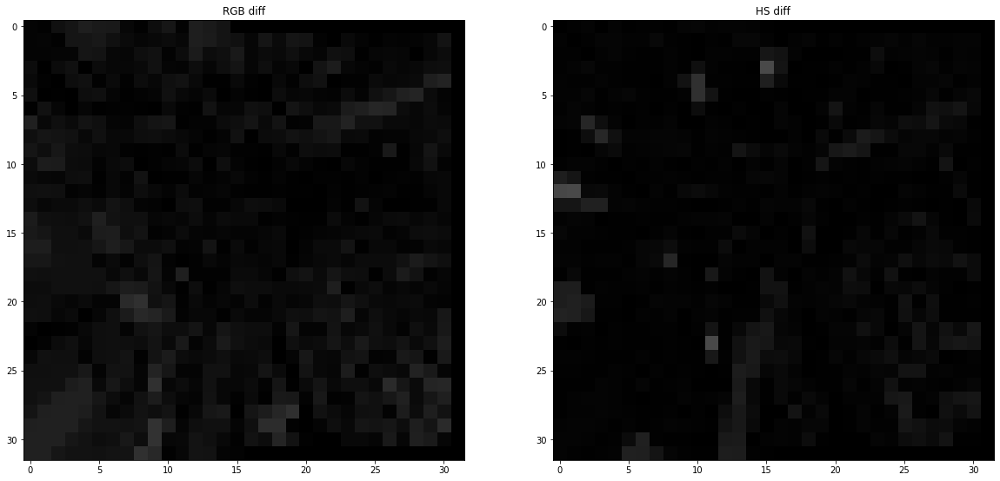

In [13]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(32), pose, intrinsics(32))

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 11.829345703125, loss HS 8.35009765625


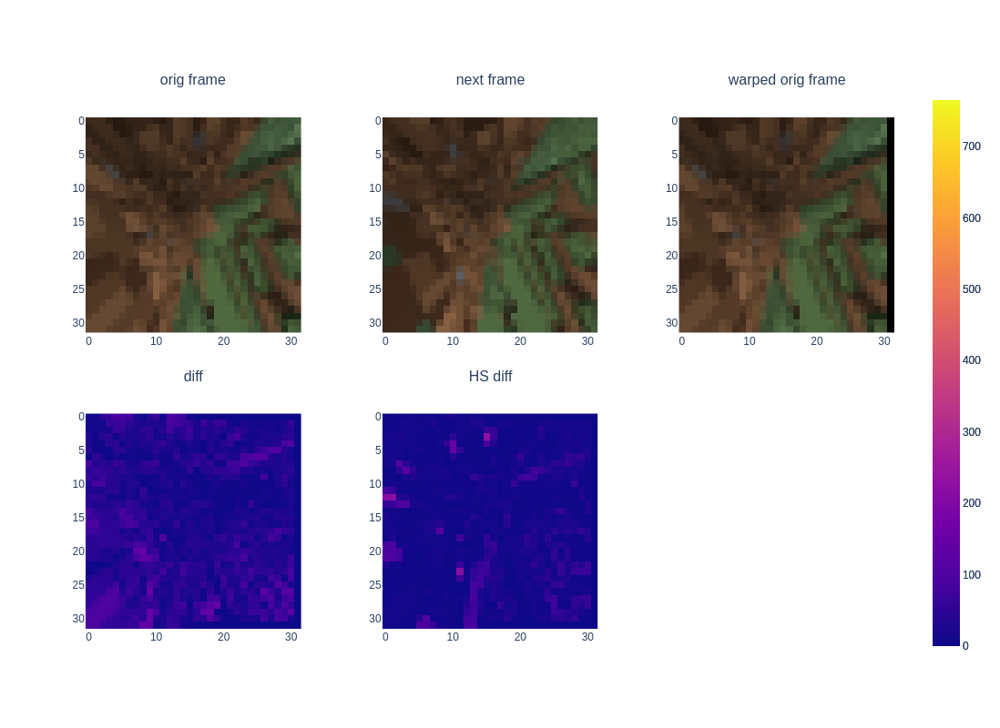

In [14]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(32), pose, intrinsics(32), interactive=True)

### 16x16

{'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


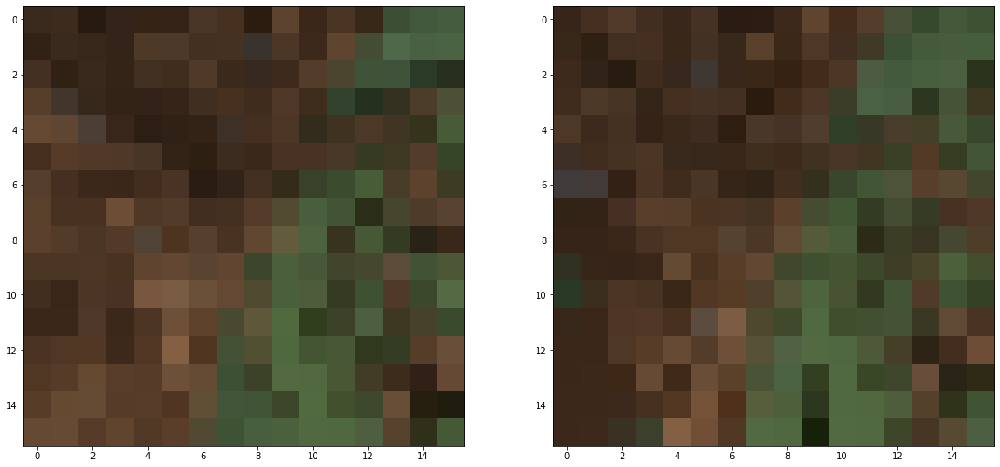

In [15]:
i = 323

first_frame = cv2.resize(annotated_frames[i][0], (16, 16)) 

second_frame = cv2.resize(annotated_frames[i + 1][0], (16, 16)) 

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 9.738112449645996, loss HS 7.646484375


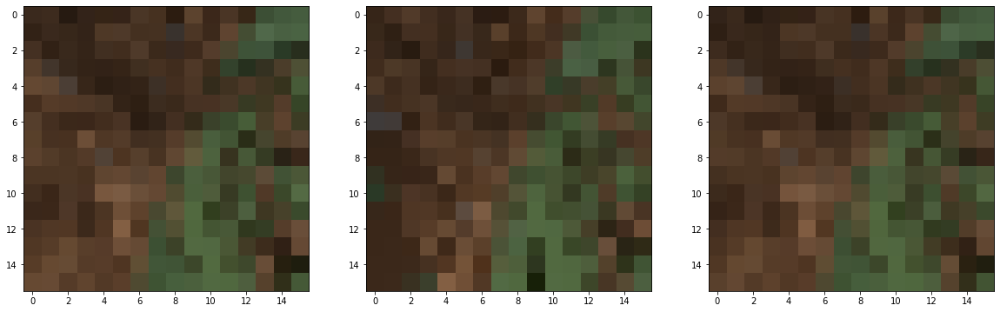

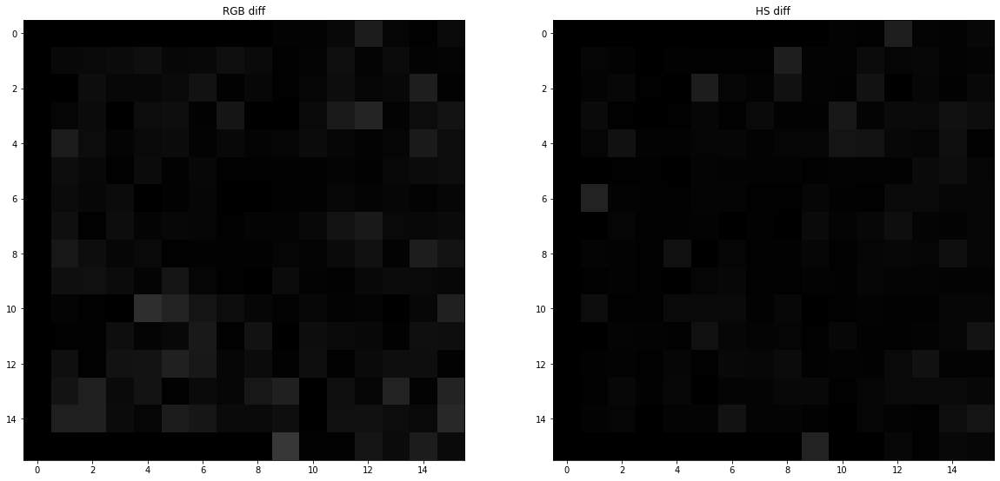

In [16]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(16), pose, intrinsics(16))

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 9.738112449645996, loss HS 7.646484375


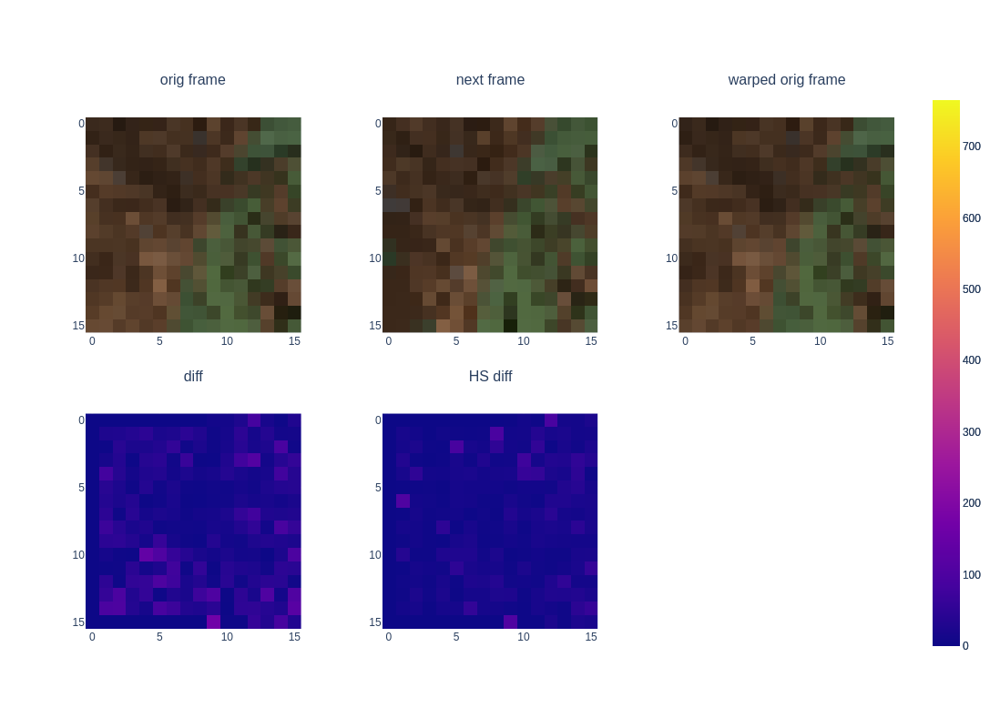

In [17]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(16), pose, intrinsics(16), interactive=True)

## Rotation: yaw

### small change

120 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.44999695], dtype=float32)}


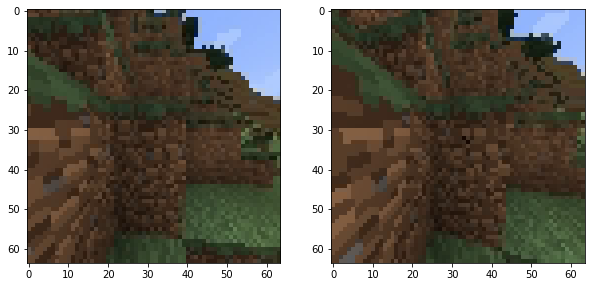

121 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -0.5999985], dtype=float32)}


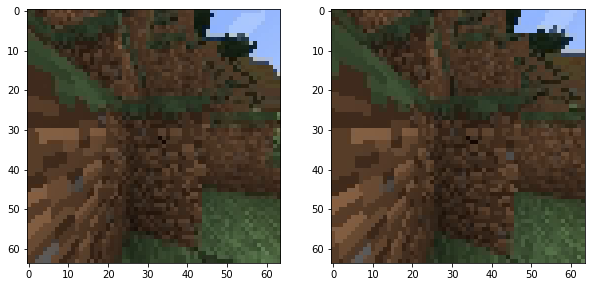

122 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.30000305], dtype=float32)}


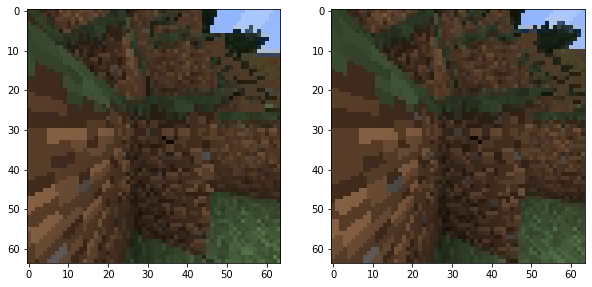

130 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


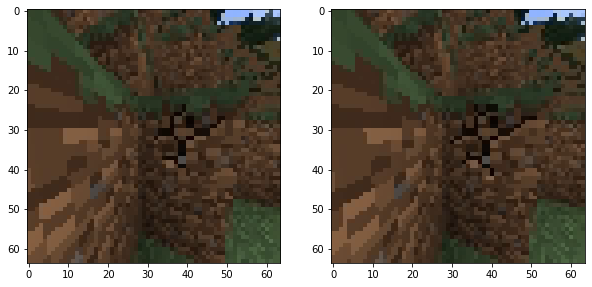

131 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


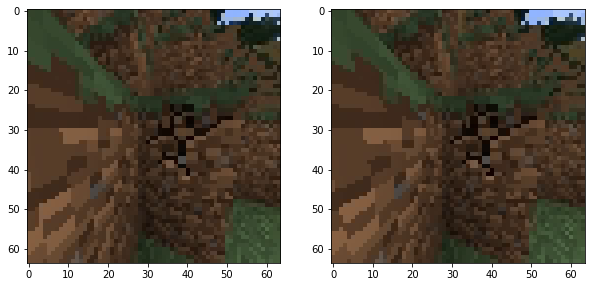

294 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  ,  6.75], dtype=float32)}


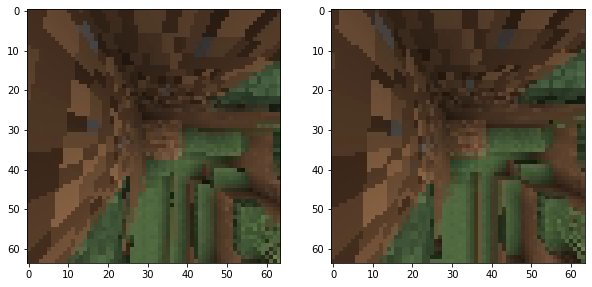

295 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  1.6499939], dtype=float32)}


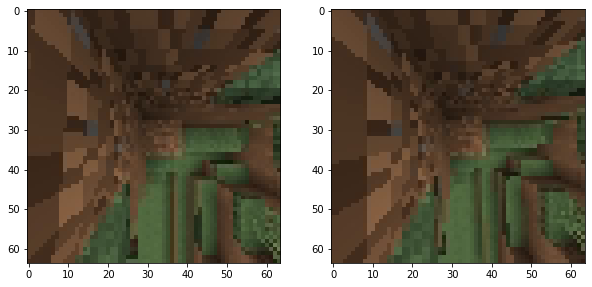

296 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  3.9000015], dtype=float32)}


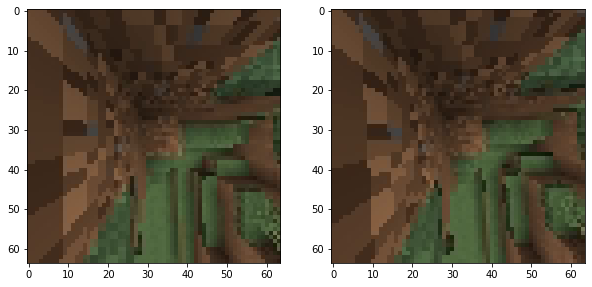

297 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  0.5999985], dtype=float32)}


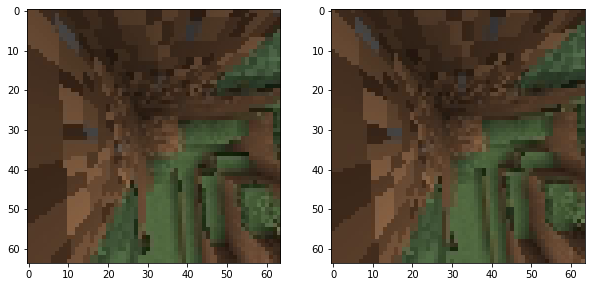

322 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  , 18.45], dtype=float32)}


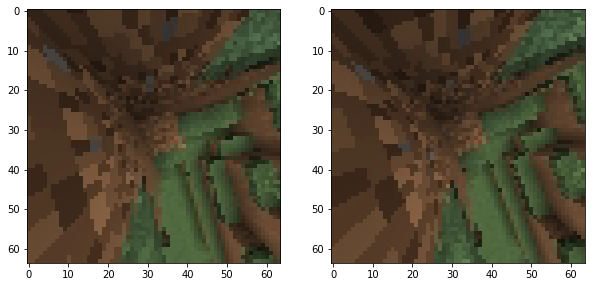

323 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


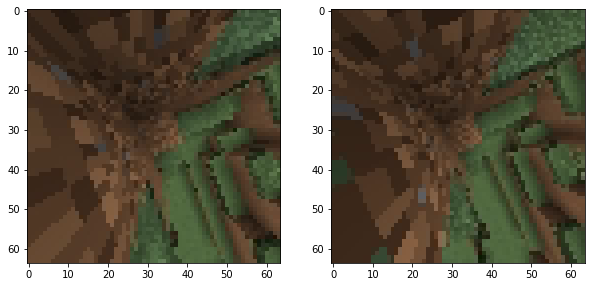

396 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  1.3499985], dtype=float32)}


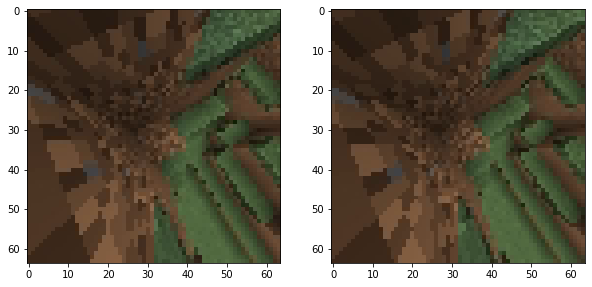

480 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.45000458], dtype=float32)}


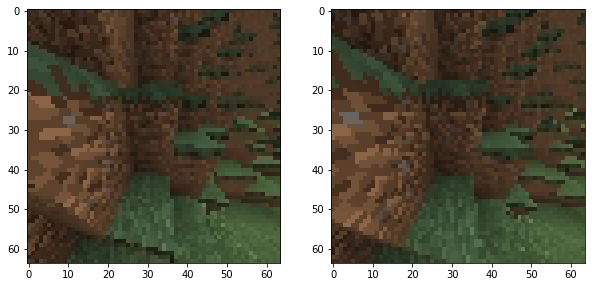

481 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


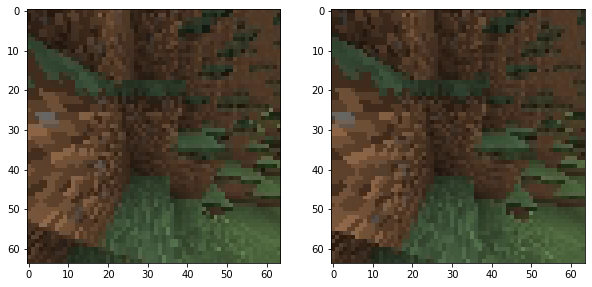

485 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


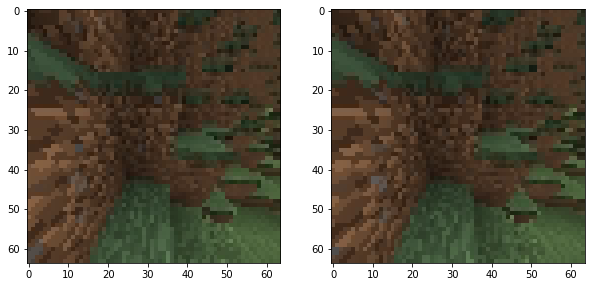

507 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.30000305], dtype=float32)}


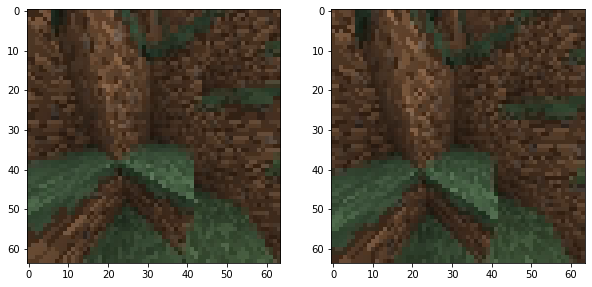

659 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -0.1499939], dtype=float32)}


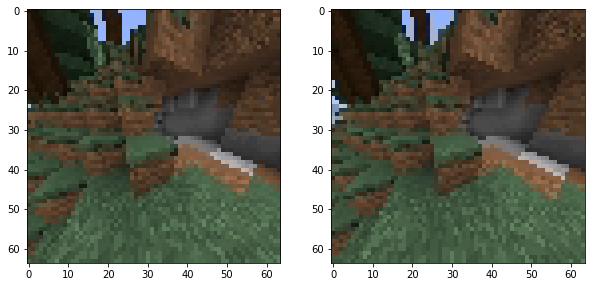

1475 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.30000305], dtype=float32)}


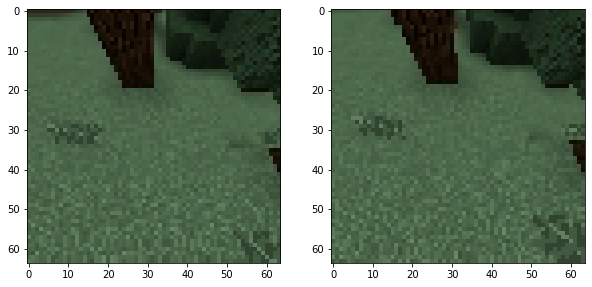

1521 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -0.5999985], dtype=float32)}


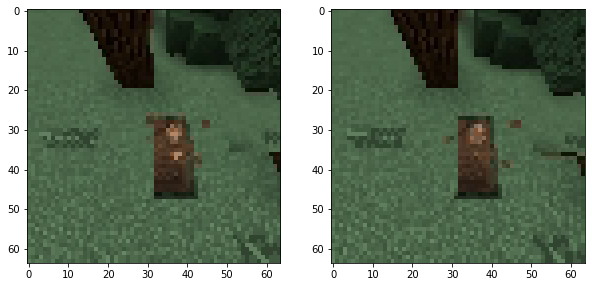

1522 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -3.9000092], dtype=float32)}


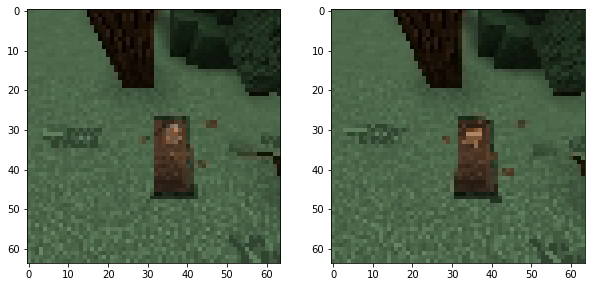

1527 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -1.5000076], dtype=float32)}


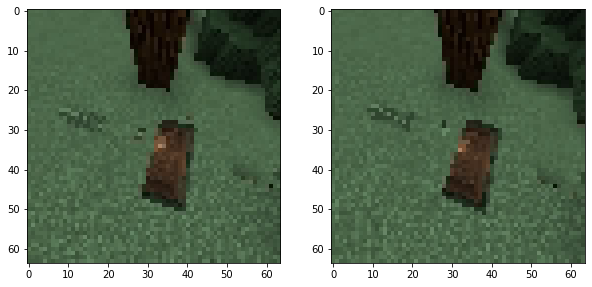

1528 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  , -0.75], dtype=float32)}


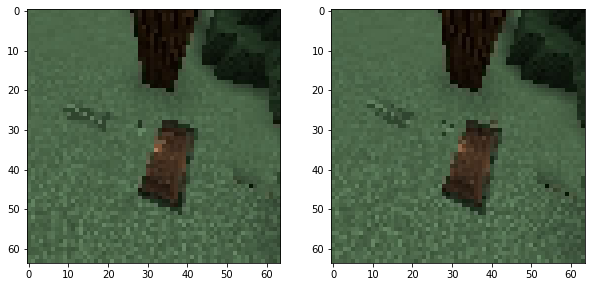

1529 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.45000458], dtype=float32)}


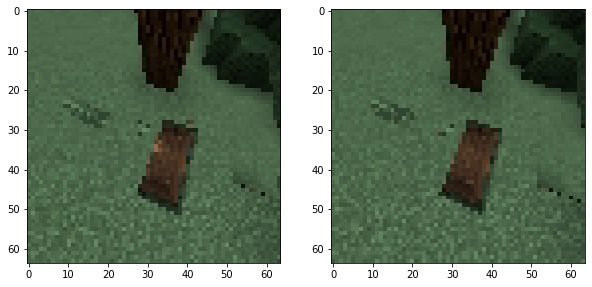

1540 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -2.8499985], dtype=float32)}


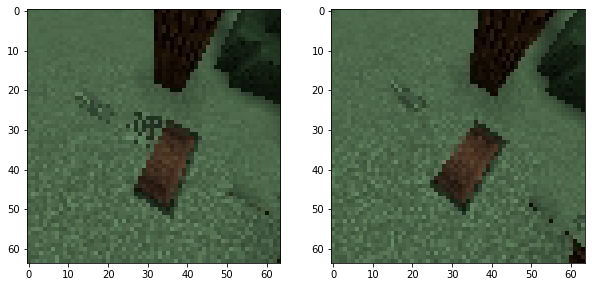

1546 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -1.7999992], dtype=float32)}


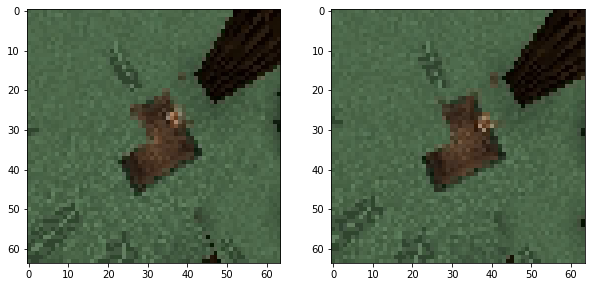

1554 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -0.1500001], dtype=float32)}


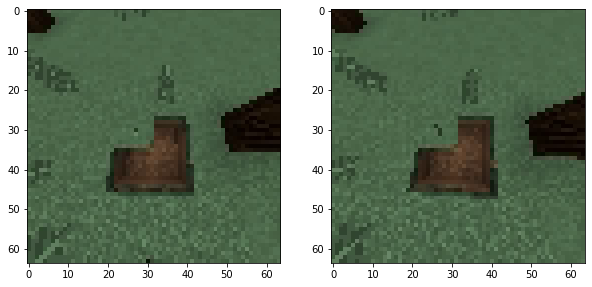

1565 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.      , -7.049999], dtype=float32)}


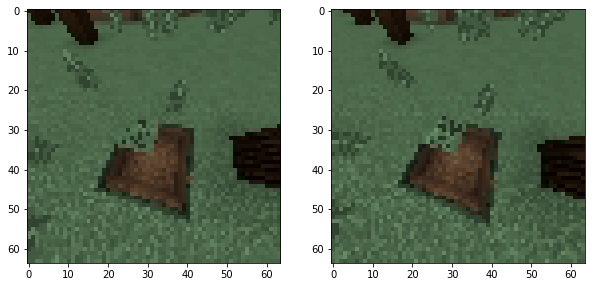

1567 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       , -1.7999992], dtype=float32)}


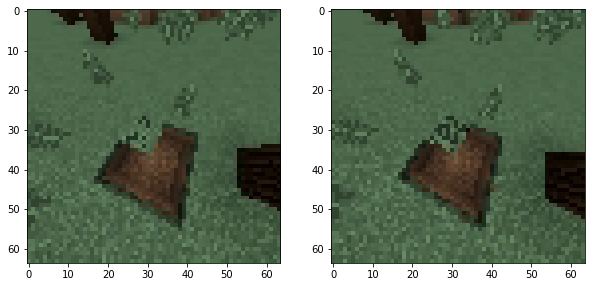

1568 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.29999924], dtype=float32)}


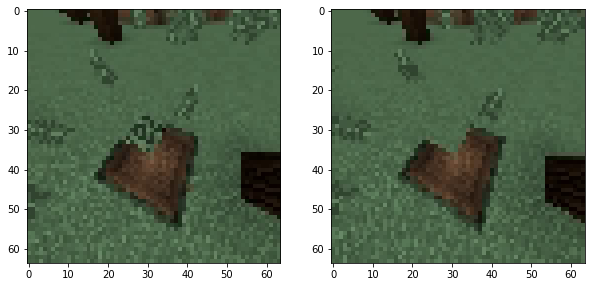

1614 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


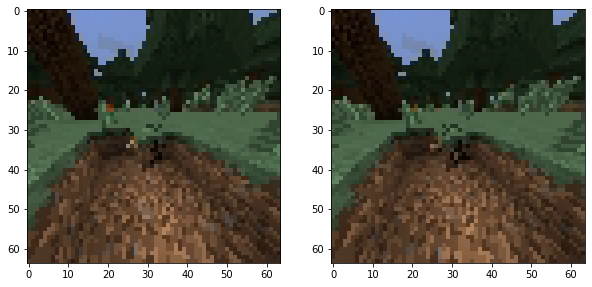

1643 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.45000076], dtype=float32)}


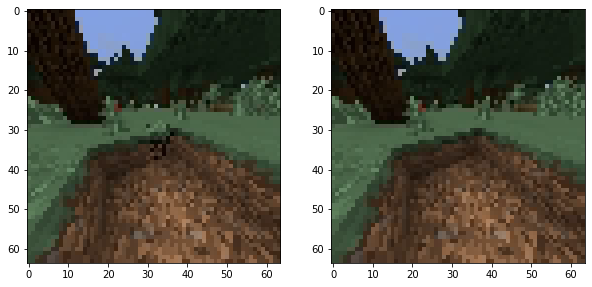

1644 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.15000153], dtype=float32)}


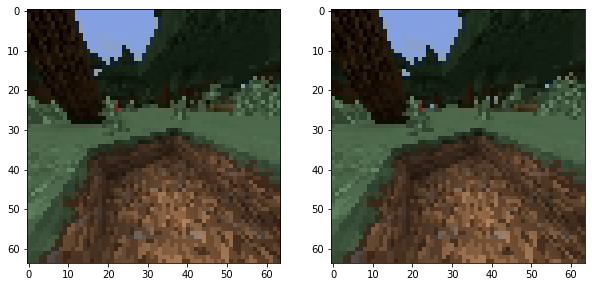

1645 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        , -0.15000153], dtype=float32)}


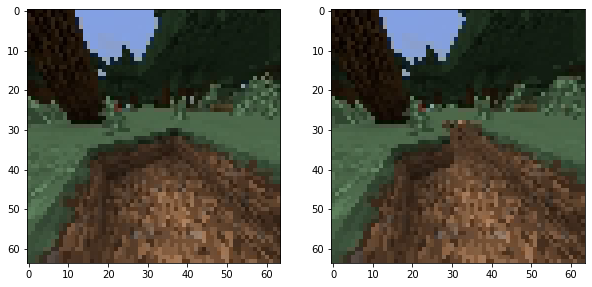

1680 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  2.4000015], dtype=float32)}


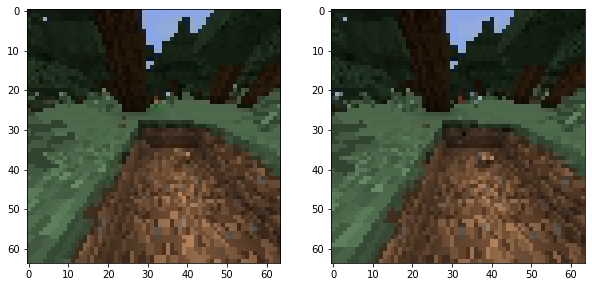

1681 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


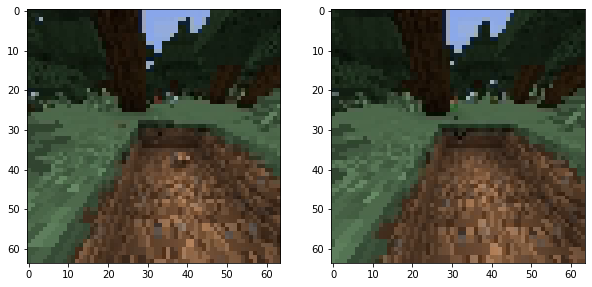

1683 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  ,  0.75], dtype=float32)}


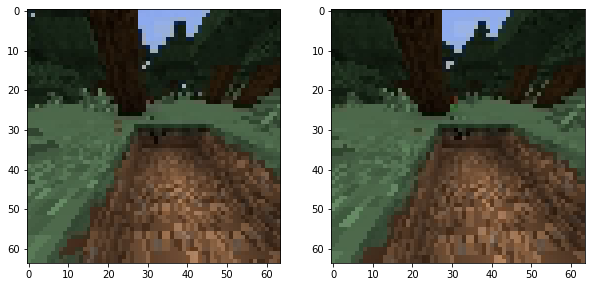

1684 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  0.8999939], dtype=float32)}


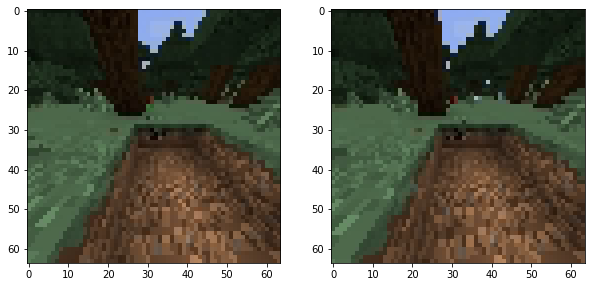

1685 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.45000458], dtype=float32)}


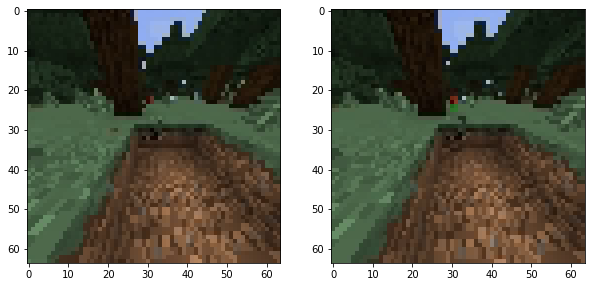

1713 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  ,  0.75], dtype=float32)}


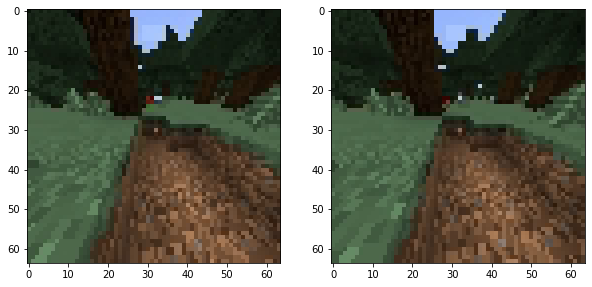

1725 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.29999924], dtype=float32)}


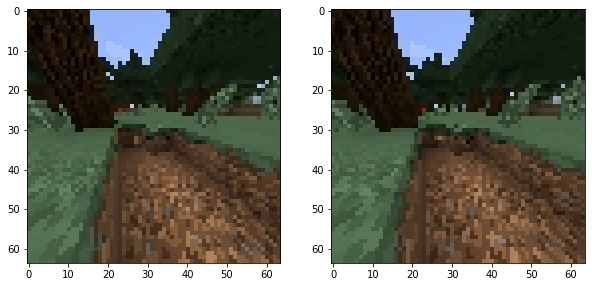

1726 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.45000076], dtype=float32)}


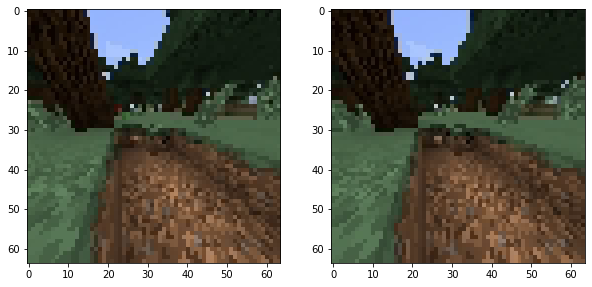

1728 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


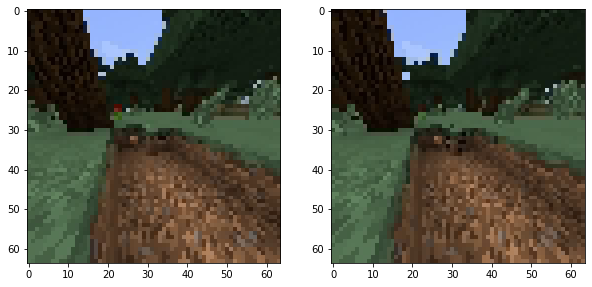

1730 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.29999924], dtype=float32)}


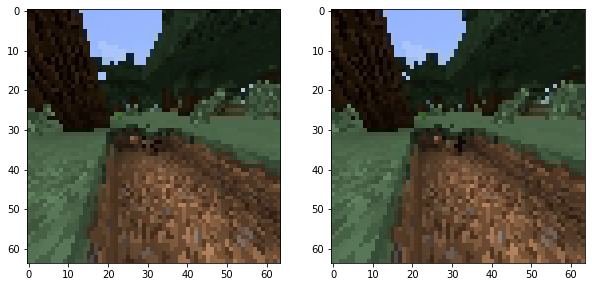

1749 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  2.4000015], dtype=float32)}


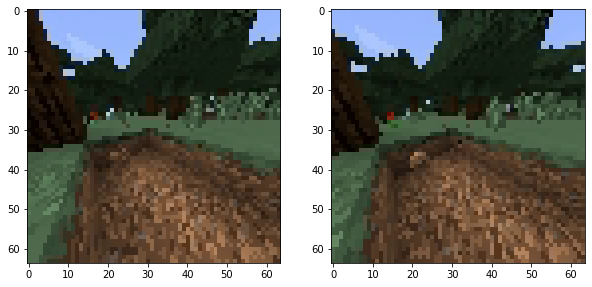

1751 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.       ,  0.8999977], dtype=float32)}


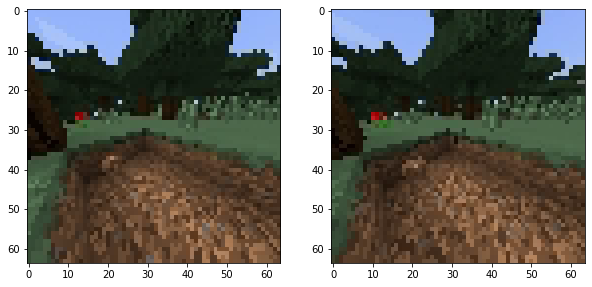

1752 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.45000076], dtype=float32)}


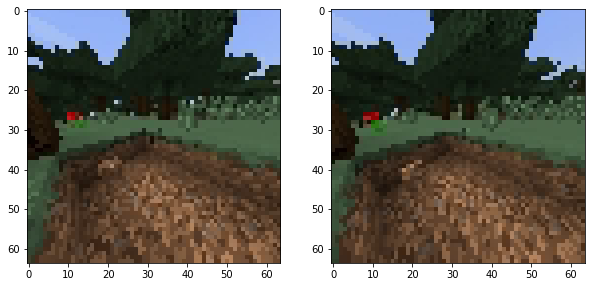

1753 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


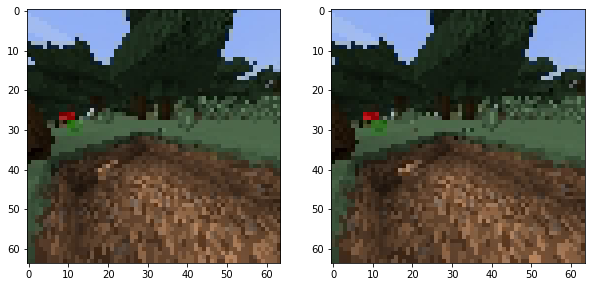

1754 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


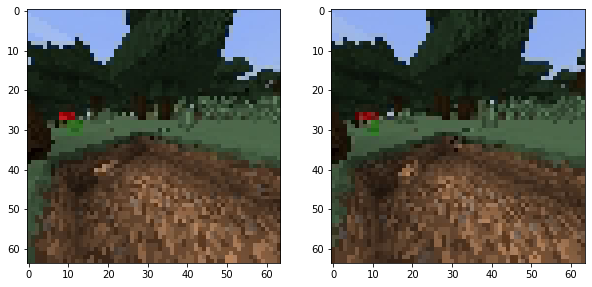

1755 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.15000153], dtype=float32)}


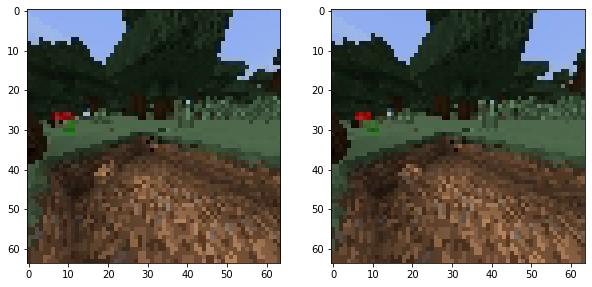

1769 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.29999924], dtype=float32)}


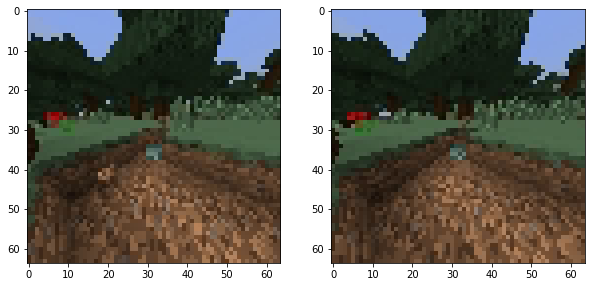

In [18]:
for i, (frame, action) in enumerate(annotated_frames):
    if action["forward"] == 0 \
        and action["left"] == 0 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][0] == 0 \
        and action["camera"][1] != 0:
        print(i, action)
        plt.figure(figsize=(10, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(frame)
        plt.subplot(1, 2, 2)
        plt.imshow(annotated_frames[i + 1][0])
        plt.show()

{'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.        ,  0.30000305], dtype=float32)}


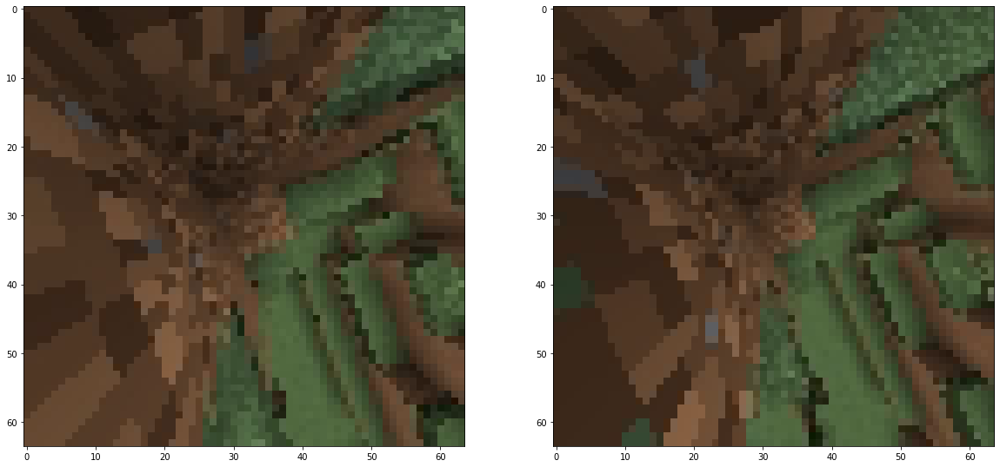

In [19]:
i = 323

first_frame = annotated_frames[i][0]
second_frame = annotated_frames[i + 1][0]

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 13.687060356140137, loss HS 11.182373046875


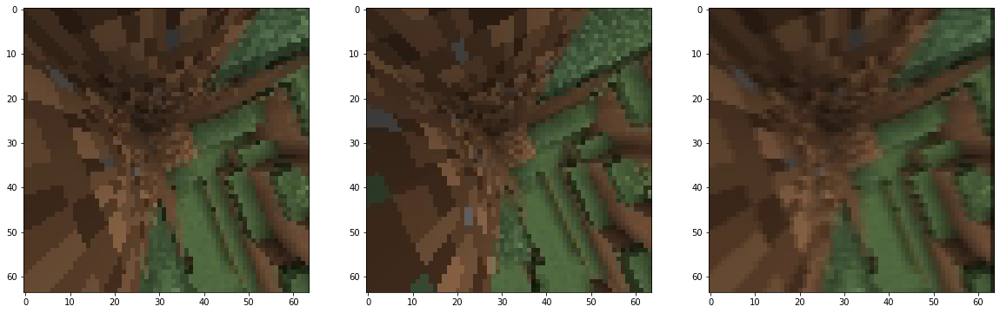

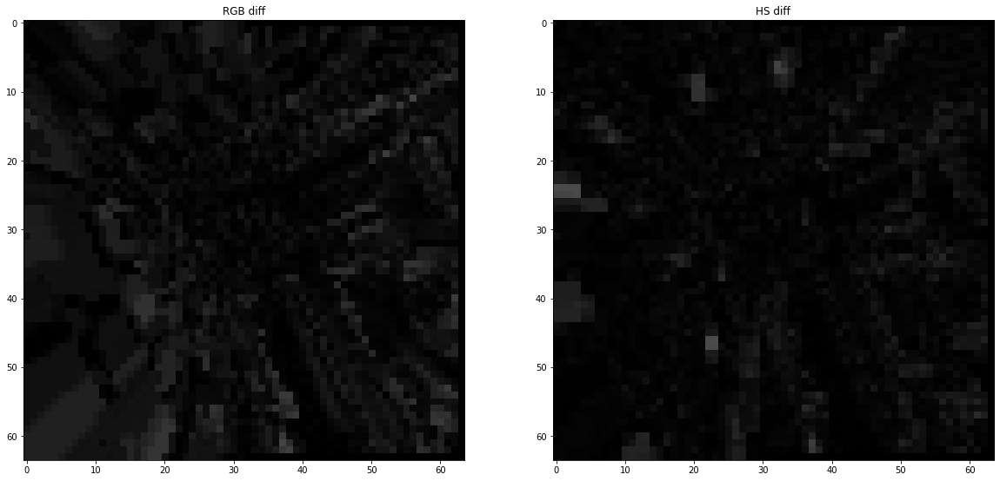

In [20]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.          0.00523604  0.        ]], loss RGB: 13.687060356140137, loss HS 11.182373046875


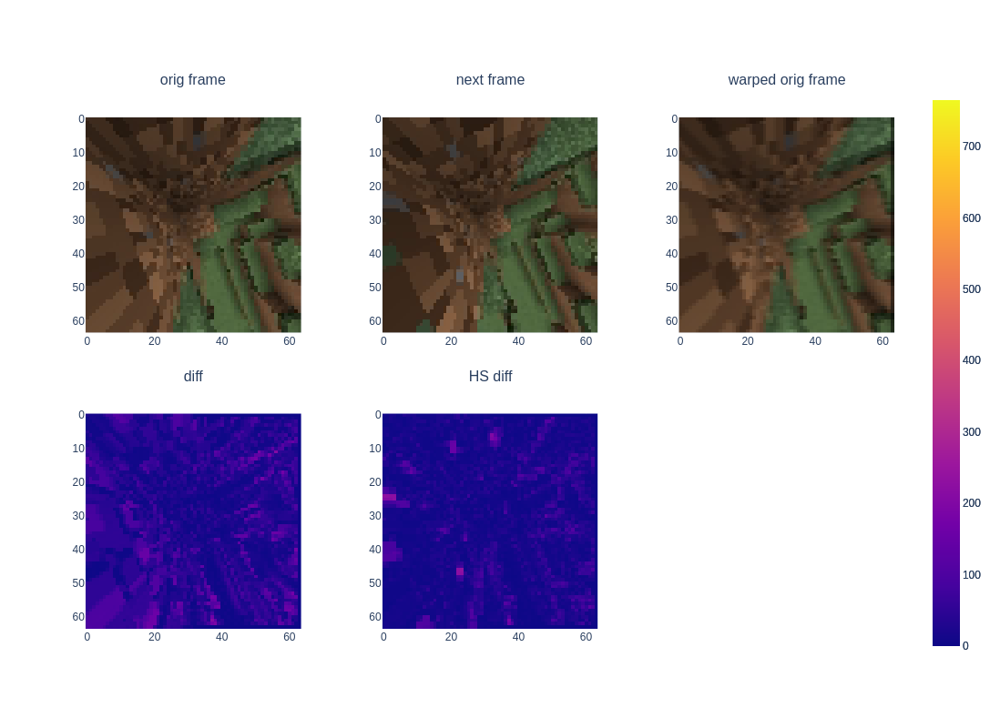

In [21]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### big change

322 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  , 18.45], dtype=float32)}


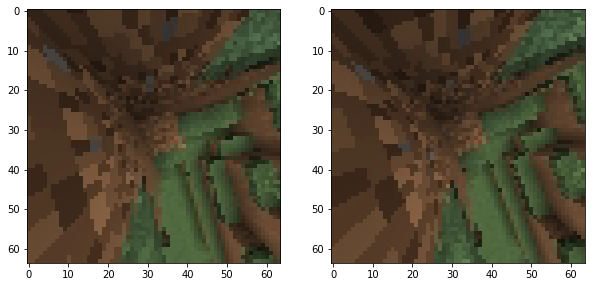

In [22]:
for i, (frame, action) in enumerate(annotated_frames):
    if action["forward"] == 0 \
        and action["left"] == 0 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][0] == 0 \
        and action["camera"][1] > 10:
        print(i, action)
        plt.figure(figsize=(10, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(frame)
        plt.subplot(1, 2, 2)
        plt.imshow(annotated_frames[i + 1][0])
        plt.show()

{'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.  , 18.45], dtype=float32)}


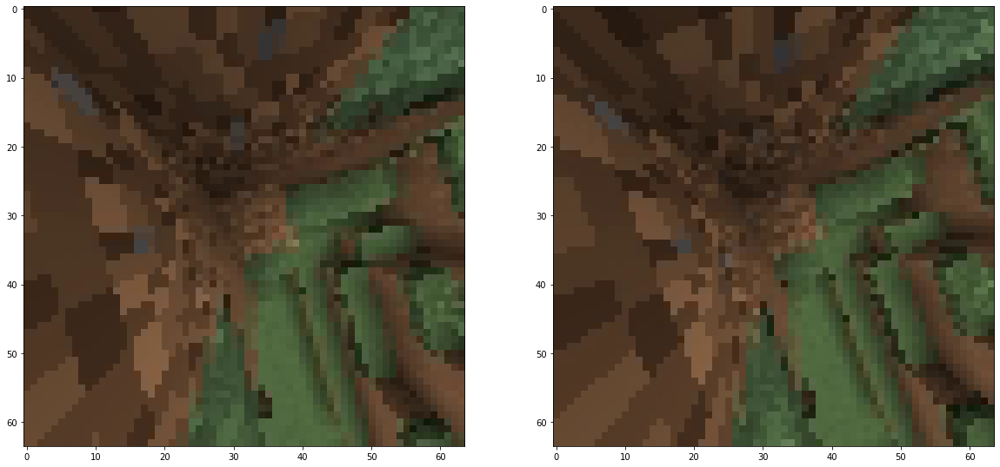

In [23]:
i = 322

first_frame = annotated_frames[i][0]
second_frame = annotated_frames[i + 1][0]

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.         -0.          0.32201326  0.        ]], loss RGB: 10.266583442687988, loss HS 12.3394775390625


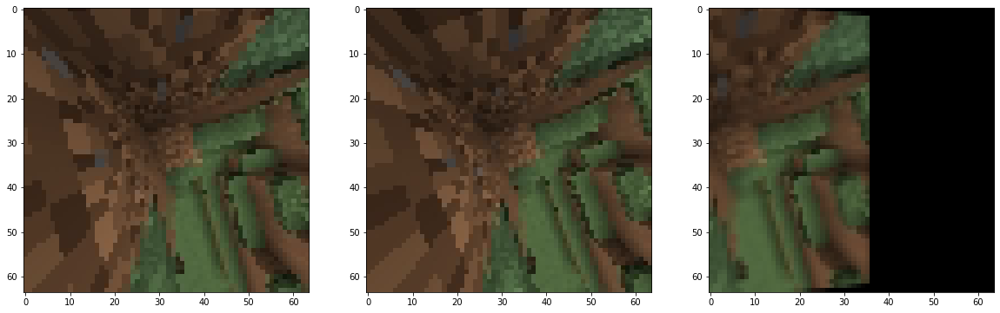

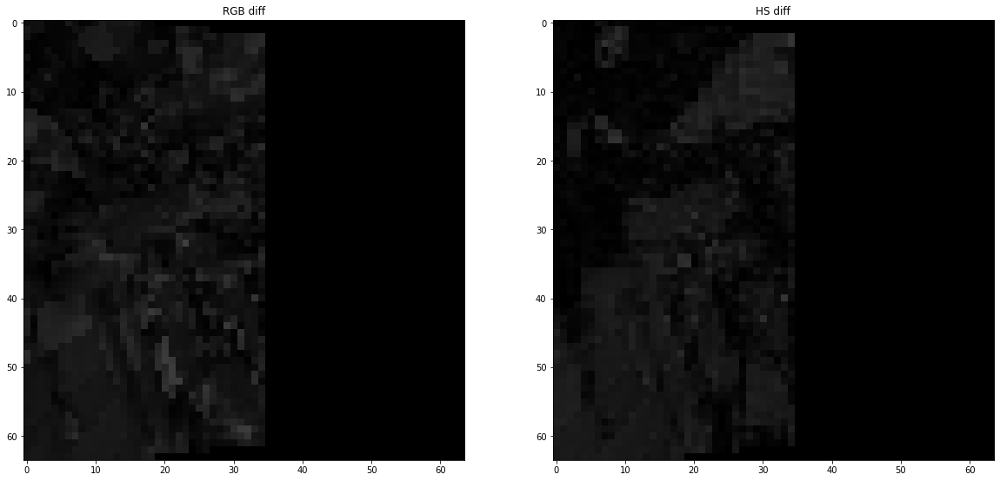

In [24]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.         -0.          0.32201326  0.        ]], loss RGB: 10.266583442687988, loss HS 12.3394775390625


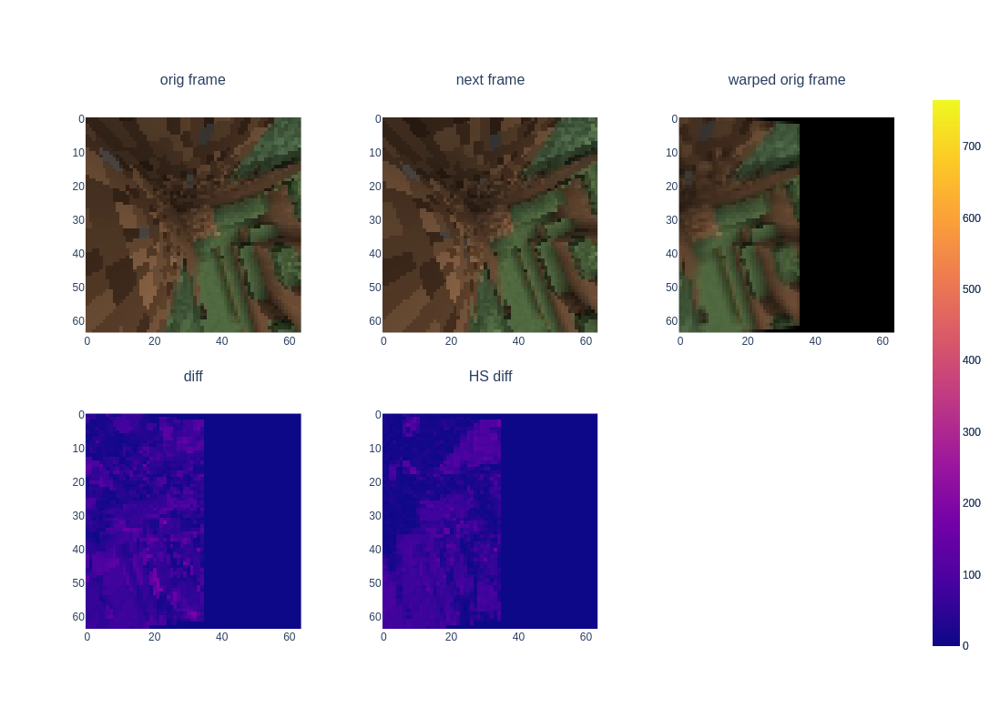

In [25]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

## Rotation: pitch

109 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.1500001, -0.       ], dtype=float32)}


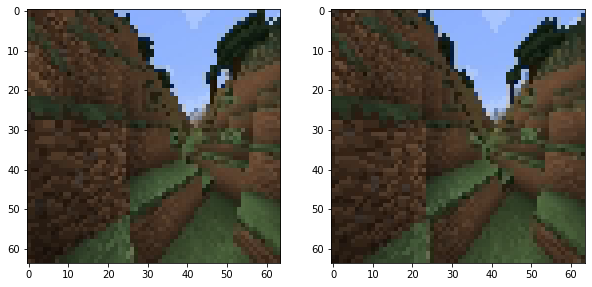

110 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.3000002, -0.       ], dtype=float32)}


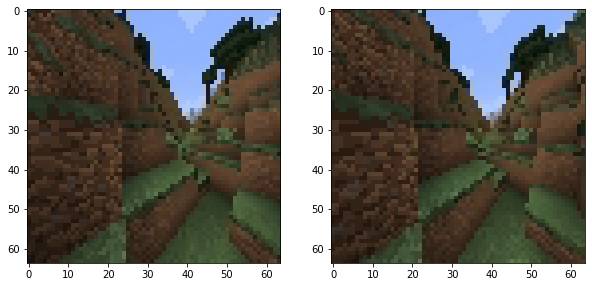

175 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.75, -0.  ], dtype=float32)}


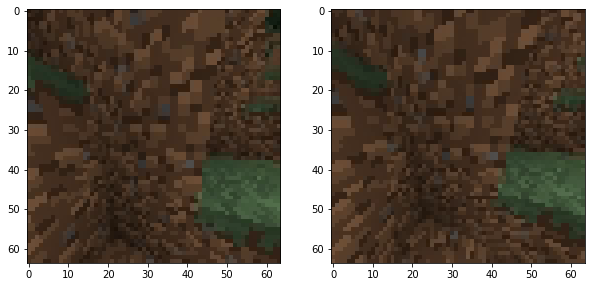

180 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 1.3500023, -0.       ], dtype=float32)}


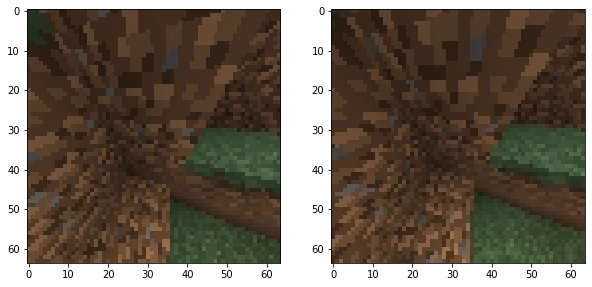

182 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.29999924, -0.        ], dtype=float32)}


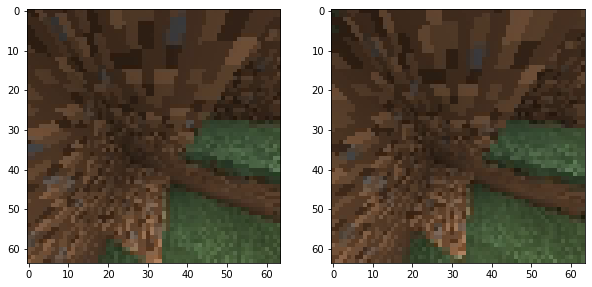

413 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.6000023, -0.       ], dtype=float32)}


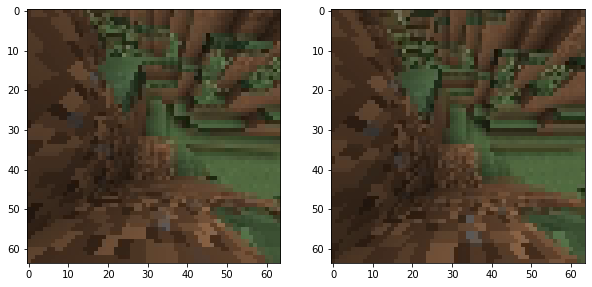

1464 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.15000153, -0.        ], dtype=float32)}


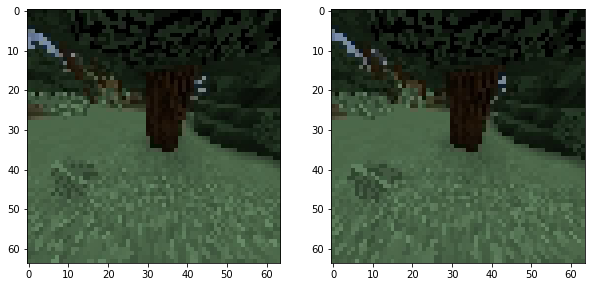

1472 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.6000061, -0.       ], dtype=float32)}


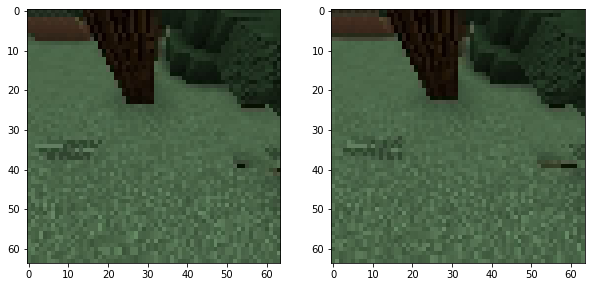

1582 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.15000153, -0.        ], dtype=float32)}


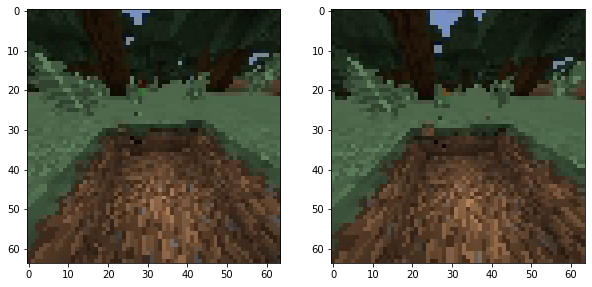

1583 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.75, -0.  ], dtype=float32)}


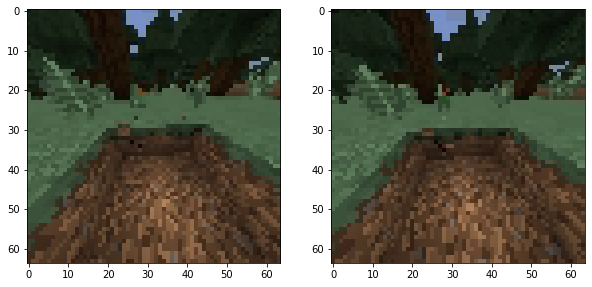

1584 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.29999924, -0.        ], dtype=float32)}


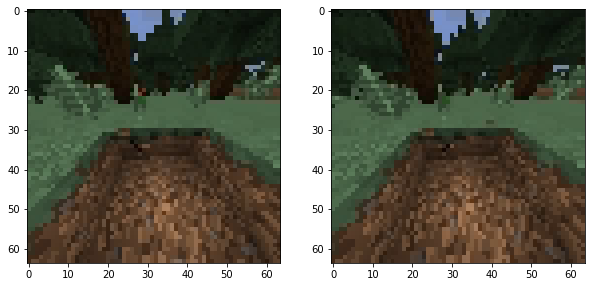

1586 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.15000153, -0.        ], dtype=float32)}


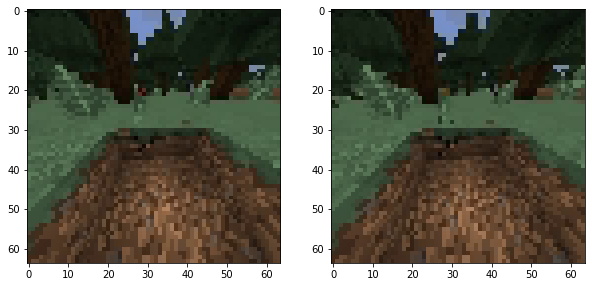

1611 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.14999962, -0.        ], dtype=float32)}


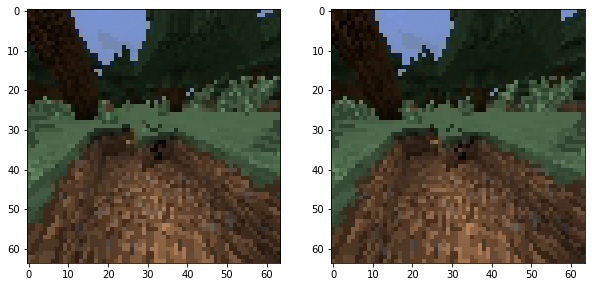

1619 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([-0.14999962, -0.        ], dtype=float32)}


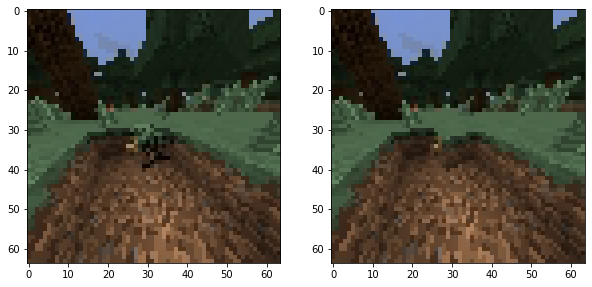

1659 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.15000153, -0.        ], dtype=float32)}


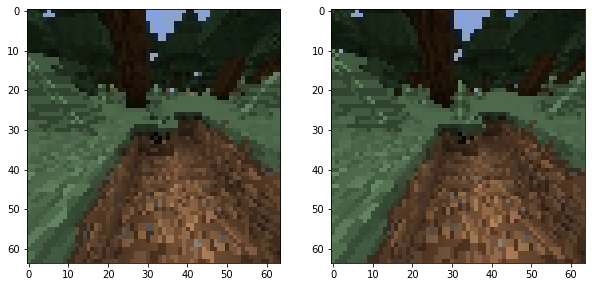

1663 {'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 0.15000153, -0.        ], dtype=float32)}


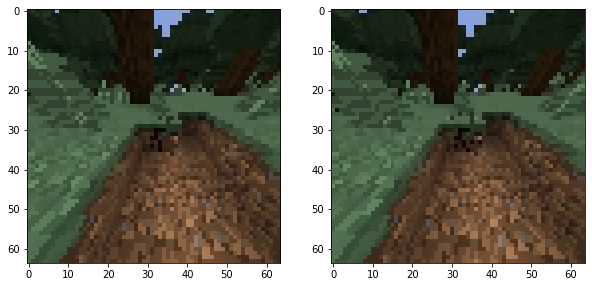

In [26]:
for i, (frame, action) in enumerate(annotated_frames):
    if action["forward"] == 0 \
        and action["left"] == 0 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][0] != 0 \
        and action["camera"][1] == 0:
        print(i, action)
        plt.figure(figsize=(10, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(frame)
        plt.subplot(1, 2, 2)
        plt.imshow(annotated_frames[i + 1][0])
        plt.show()

{'forward': 0, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([ 1.3500023, -0.       ], dtype=float32)}


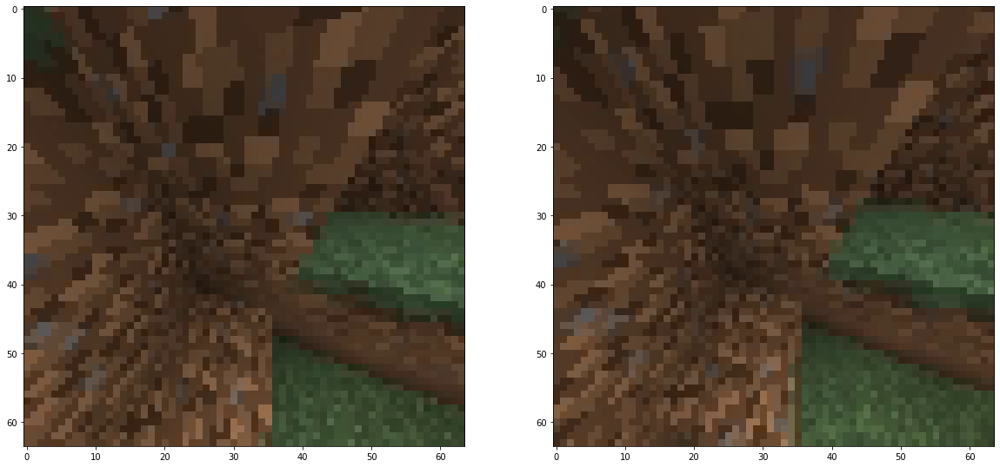

In [27]:
i = 180

first_frame = annotated_frames[i][0]
second_frame = annotated_frames[i + 1][0]

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

pose: [[ 0.          0.          0.          0.02356198 -0.          0.        ]], loss RGB: 13.008602142333984, loss HS 12.2978515625


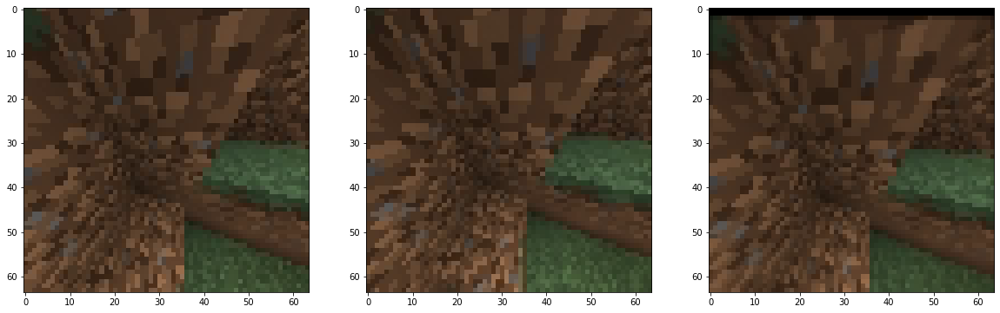

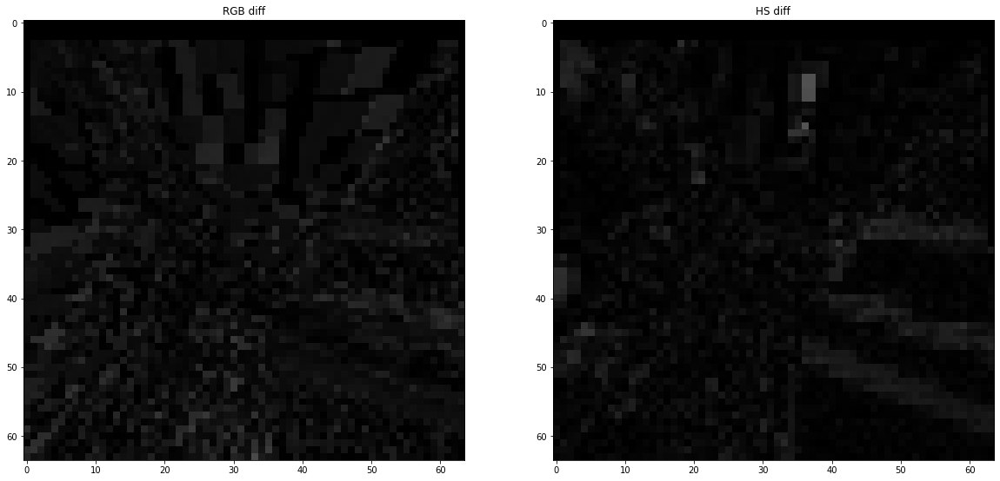

In [28]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[ 0.          0.          0.          0.02356198 -0.          0.        ]], loss RGB: 13.008602142333984, loss HS 12.2978515625


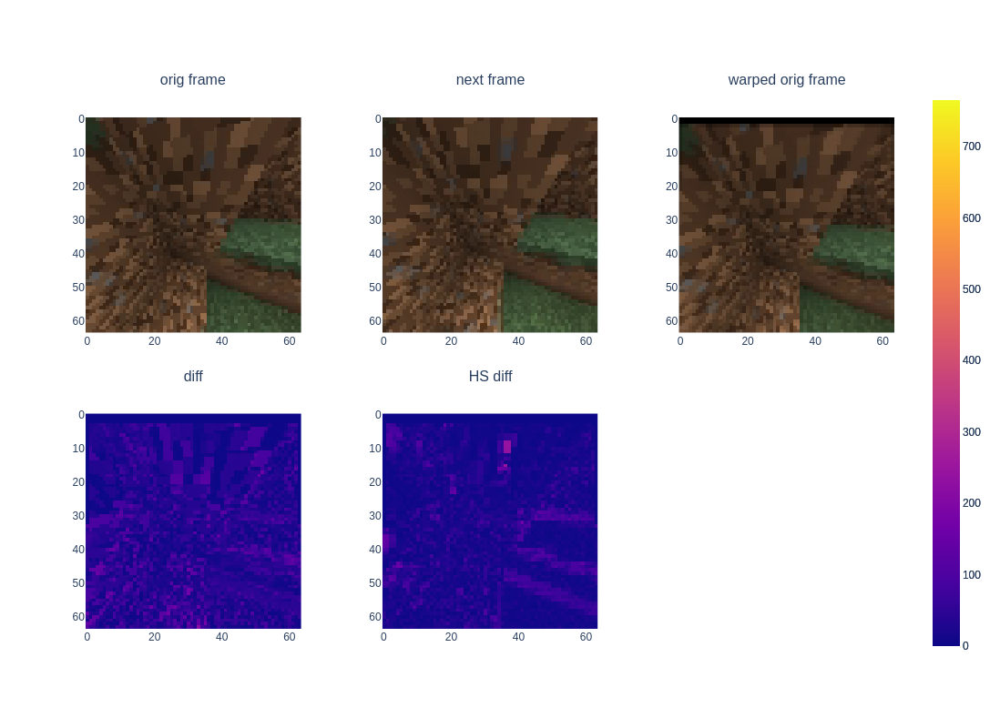

In [29]:
pose = np.array([0, 0, 0, action["camera"][0] * np.pi / 180, action["camera"][1] * np.pi / 180, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

## Translation: forward

In [30]:
for i, (frame, action) in enumerate(annotated_frames):
    if action["forward"] == 1 \
        and action["left"] == 0 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][1] == 0 \
        and action["camera"][0] == 0:
        print(i)

0
13
14
15
16
17
28
29
30
31
32
33
34
35
36
37
38
39
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
88
96
97
143
144
145
146
154
155
156
277
278
279
280
440
441
442
443
444
453
455
456
457
458
477
479
512
513
548
549
565
566
570
611
612
613
642
643
644
671
672
673
674
675
679
680
681
682
683
684
685
691
694
695
706
707
708
709
710
711
712
713
714
715
716
717
718
719
720
721
722
731
732
733
738
739
740
741
742
773
792
793
794
795
796
797
798
799
800
801
802
803
804
809
810
811
812
813
814
815
816
817
818
819
820
821
822
823
826
827
828
829
830
831
832
836
837
838
839
840
841
842
843
844
845
864
865
866
867
1312
1313
1314
1315
1366
1367
1368
1369
1370
1371
1372
1373
1374
1375
1376
1377
1378
1379
1380
1381
1382
1383
1387
1388
1389
1390
1391
1392
1393
1503
1504
1783
1784
1785
1790
1791


{'forward': 1, 'left': 0, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([0., 0.], dtype=float32)}


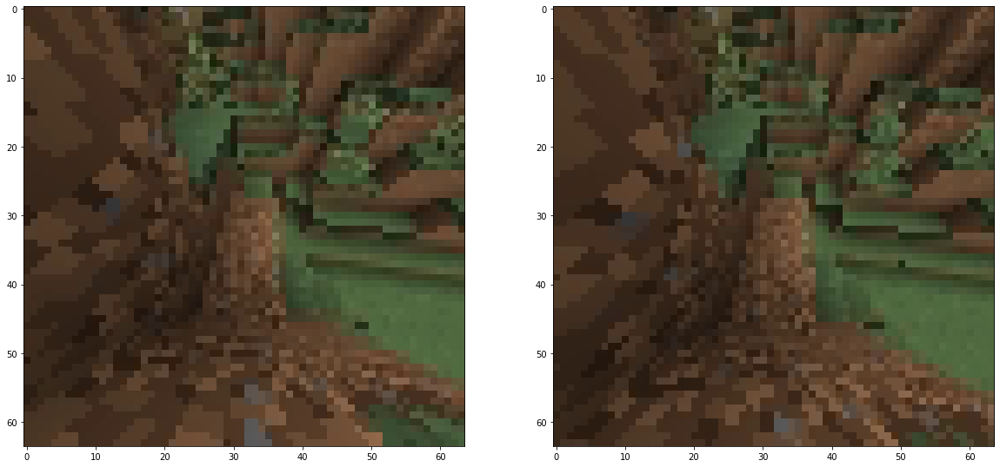

In [31]:
i = 440
first_frame = annotated_frames[i][0]
second_frame = annotated_frames[i + 1][0]

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

### grid search best pose val

In [32]:
first_frame_tensor = torch.from_numpy(np.transpose(first_frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

second_frame_tensor = torch.from_numpy(np.transpose(second_frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

In [33]:
from scipy.optimize import minimize

def func(tz):
    pose = np.array([0, 0, tz[0], 0, 0, 0])
    pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)

    warped_img_tensor, valid_points = inverse_warp(first_frame_tensor, depth_plane(), pose, intrinsics())

    diff = (second_frame_tensor - warped_img_tensor) * valid_points.unsqueeze(1).float()
    
    return float(diff.abs().mean())

init_tz = 42
bounds = ((0,None),)

res = minimize(func, init_tz, method="Powell", tol=1e-3, bounds=bounds)
res

   direc: array([[0.01205216]])
     fun: array(8.63972378)
 message: 'Optimization terminated successfully.'
    nfev: 51
     nit: 2
  status: 0
 success: True
       x: array([0.96042702])

pose: [[0.         0.         0.96042705 0.         0.         0.        ]], loss RGB: 8.639723777770996, loss HS 7.9932861328125


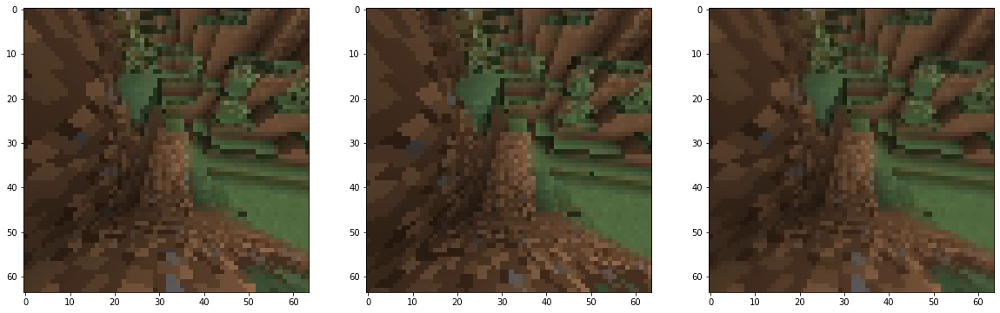

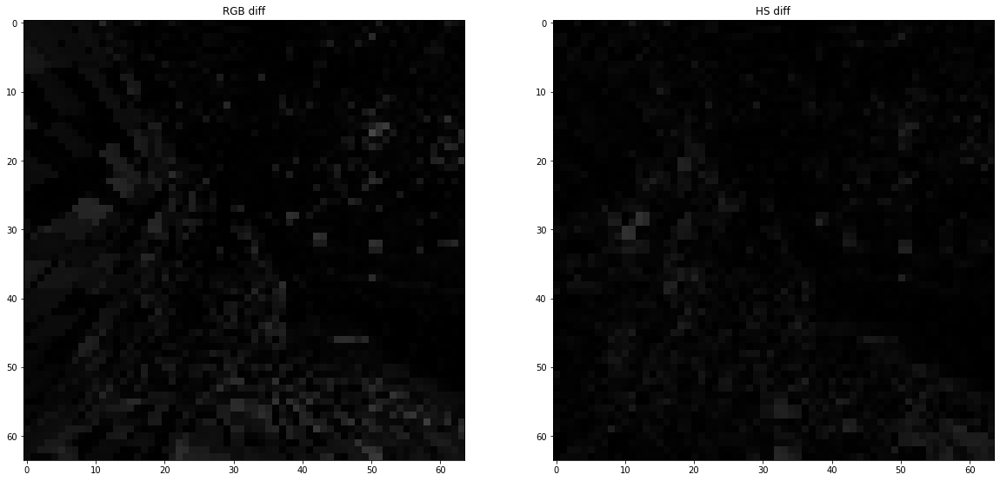

In [34]:
tz = res.x[0]
pose = np.array([0, 0, tz, 0, 0, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[0.         0.         0.96042705 0.         0.         0.        ]], loss RGB: 8.639723777770996, loss HS 7.9932861328125


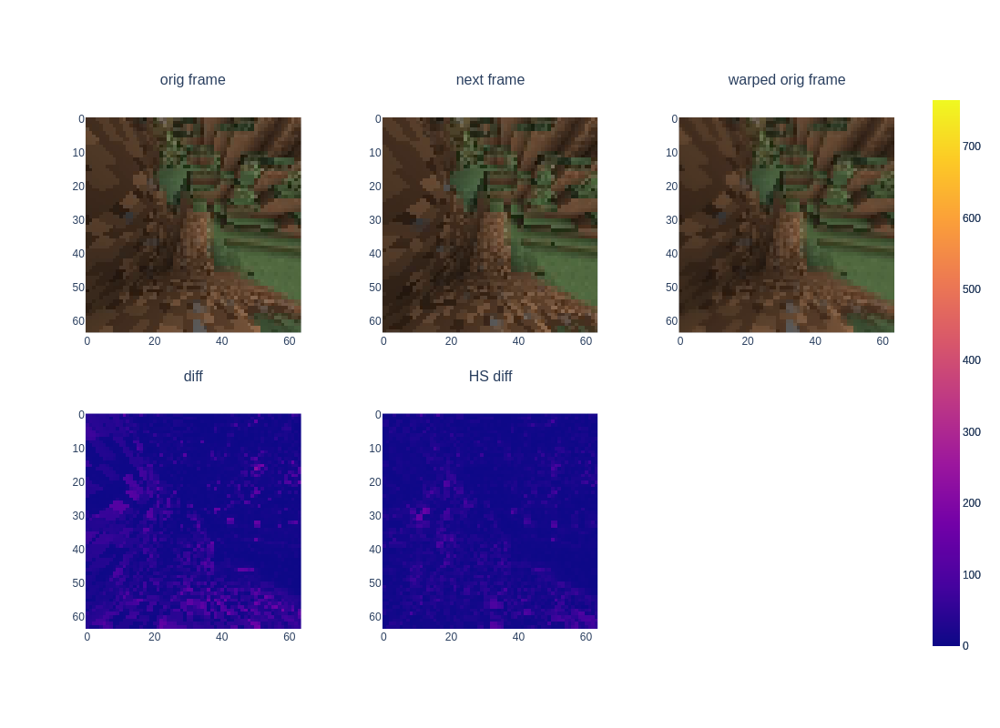

In [35]:
tz = res.x[0]
pose = np.array([0, 0, tz, 0, 0, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

### test hyperparemeter validity

In [36]:
from scipy.optimize import minimize

def func(tz):
        pose = np.array([0, 0, tz[0], 0, 0, 0])
        pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)

        warped_img_tensor, valid_points = inverse_warp(first_frame_tensor, depth_plane(), pose, intrinsics())

        diff = (second_frame_tensor - warped_img_tensor) * valid_points.unsqueeze(1).float()

        return float(diff.abs().mean())

init_tz = 15
bounds = ((0,None),)

min_res = []

for i, (frame, action) in enumerate(annotated_frames):
    
    if action["forward"] == 1 \
        and action["left"] == 0 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][1] == 0 \
        and action["camera"][0] == 0:
        
        if i + 1 < len(annotated_frames):
            first_frame_tensor = convert_frame_to_tensor(annotated_frames[i][0])
            second_frame_tensor = convert_frame_to_tensor(annotated_frames[i + 1][0])

            res = minimize(func, init_tz, method="Powell", tol=1e-3, bounds=bounds)
            min_res.append(res)

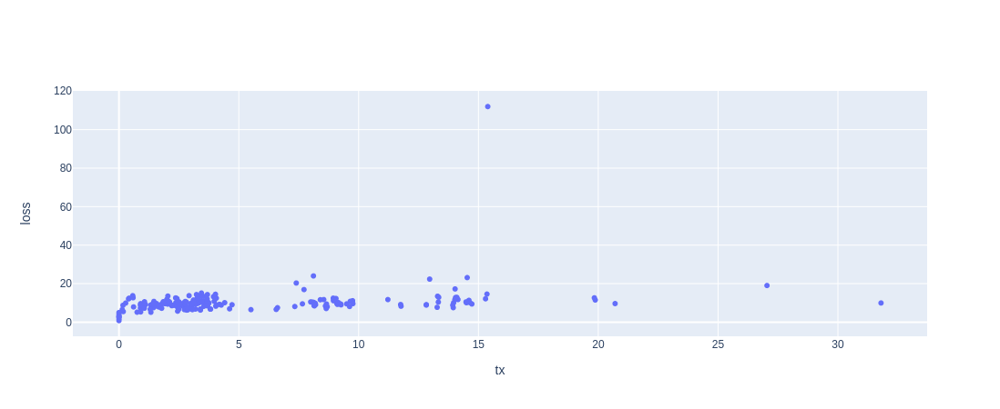

In [37]:
import plotly.graph_objects as go
import numpy as np

x = [r.x[0] for r in min_res]
y = [float(r.fun) for r in min_res]

fig = go.Figure(data=go.Scatter(x=x, y=y, mode="markers"))
fig.update_xaxes(title_text="tx")
fig.update_yaxes(title_text="loss")
fig.show()

## Translation: left

In [38]:
for i, (frame, action) in enumerate(annotated_frames):
    if action["forward"] == 0 \
        and action["left"] == 1 \
        and action["right"] == 0 \
        and action["sneak"] == 0 \
        and action["sprint"] == 0 \
        and action["camera"][1] == 0 \
        and action["camera"][0] == 0:
        print(i)

114
220
221
222
223
537
538
539
540
541
542
573
574
590
591
1308
1309
1310
1358
1359
1360
1361
1362
1363
1395
1396
1397
1398
1399
1400
1401
1402
1403
1404
1405
1406


{'forward': 0, 'left': 1, 'right': 0, 'sneak': 0, 'sprint': 0, 'camera': array([0., 0.], dtype=float32)}


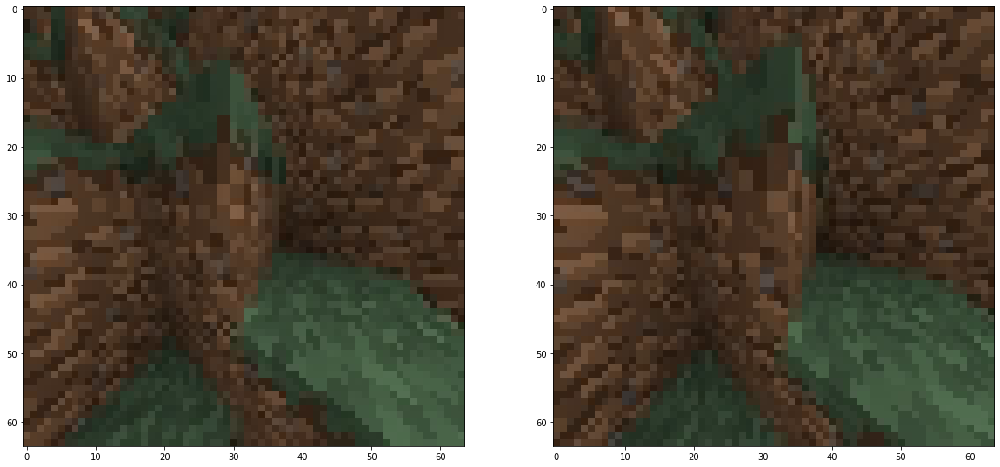

In [39]:
i = 591
first_frame = annotated_frames[i][0]
second_frame = annotated_frames[i + 1][0]

action = annotated_frames[i][1]
print(action)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(first_frame)
plt.subplot(1, 2, 2)
plt.imshow(second_frame)
plt.show()

### grid search best pose val

In [40]:
first_frame_tensor = torch.from_numpy(np.transpose(first_frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

second_frame_tensor = torch.from_numpy(np.transpose(second_frame, (2, 0, 1)).astype(np.float32)).unsqueeze(0)

In [41]:
from scipy.optimize import minimize

def func(tx):
    pose = np.array([tx[0], 0, 0, 0, 0, 0])
    pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)

    warped_img_tensor, valid_points = inverse_warp(first_frame_tensor, depth_plane(), pose, intrinsics())

    diff = (second_frame_tensor - warped_img_tensor) * valid_points.unsqueeze(1).float()
    
    return float(diff.abs().mean())

init_tx = -6
bounds = ((None,0),)

res = minimize(func, init_tx, method="Powell", tol=1e-3, bounds=bounds)
res

   direc: array([[5.42261727e-05]])
     fun: array(10.57928181)
 message: 'Optimization terminated successfully.'
    nfev: 43
     nit: 2
  status: 0
 success: True
       x: array([-6.10928994])

pose: [[-6.10929  0.       0.       0.       0.       0.     ]], loss RGB: 10.5792818069458, loss HS 11.7135009765625


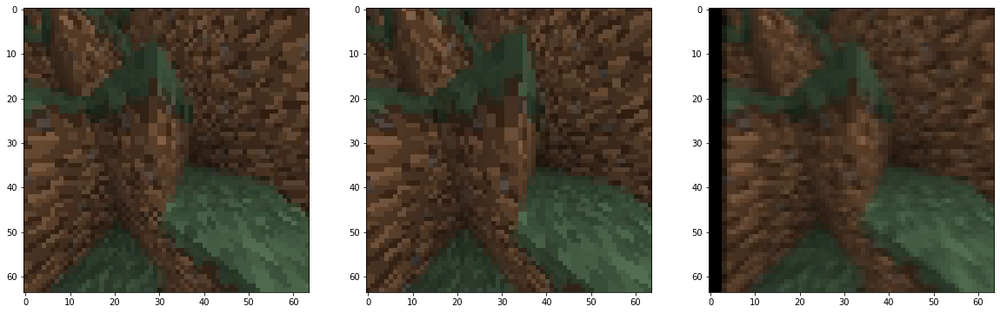

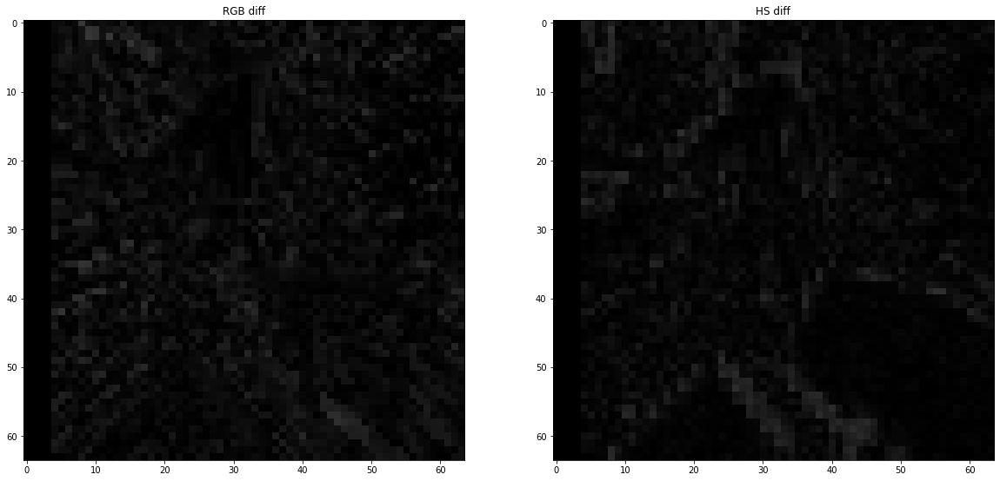

In [42]:
tx = res.x[0]
pose = np.array([tx, 0, 0, 0, 0, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics())

pose: [[-6.10929  0.       0.       0.       0.       0.     ]], loss RGB: 10.5792818069458, loss HS 11.7135009765625


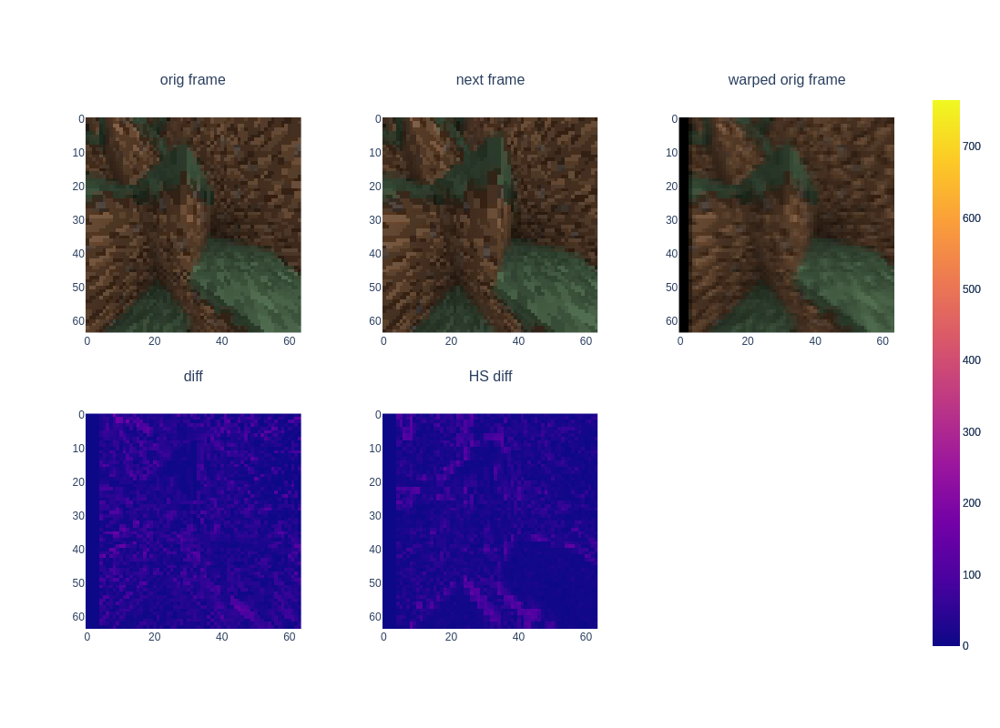

In [43]:
tz = res.x[0]
pose = np.array([tx, 0, 0, 0, 0, 0])
pose = torch.from_numpy(pose.astype(np.float32)).unsqueeze(0)
visualize_diff(first_frame, second_frame, depth_plane(), pose, intrinsics(), interactive=True)

# Video

## minerl